## Libraries

In [129]:
import os
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import librosa

import librosa.display
import IPython.display as ipd
from scipy.signal import find_peaks

## Import Audio

In [130]:
# y, sr = librosa.load('../Audio/The Beach Boys [Pet Sounds] - Sloop John B (Stereo Remaster).mp3')
y, sr = librosa.load('../Audio/Bon Jovi [Keep the Faith] - Save a prayer.mp3', offset=15, duration=30)

## Play Audio

In [131]:
ipd.Audio(y, rate=sr)

## STFT - High

In [132]:
D = librosa.stft(y)

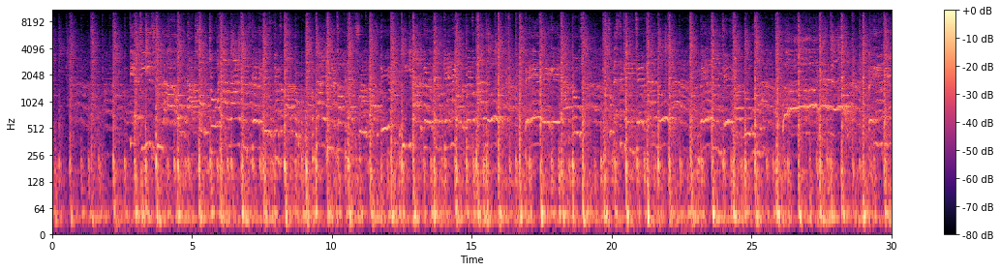

In [133]:
plt.figure(figsize=(16, 4))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

## Median filter

## $$ D = D_{harmonic} + D_{percussive} $$

In [134]:
D_harmonic, D_percussive = librosa.decompose.hpss(D, kernel_size = (17, 17))

## Create Masks and Filter

In [135]:
power = 2

mask_harmonic = librosa.util.softmask(np.abs(D_harmonic), np.abs(D_percussive), power = power)
mask_percussive = librosa.util.softmask(np.abs(D_percussive), np.abs(D_harmonic), power = power)

S_harmonic = mask_harmonic*D
S_percussive = mask_percussive*D

## Spectogram

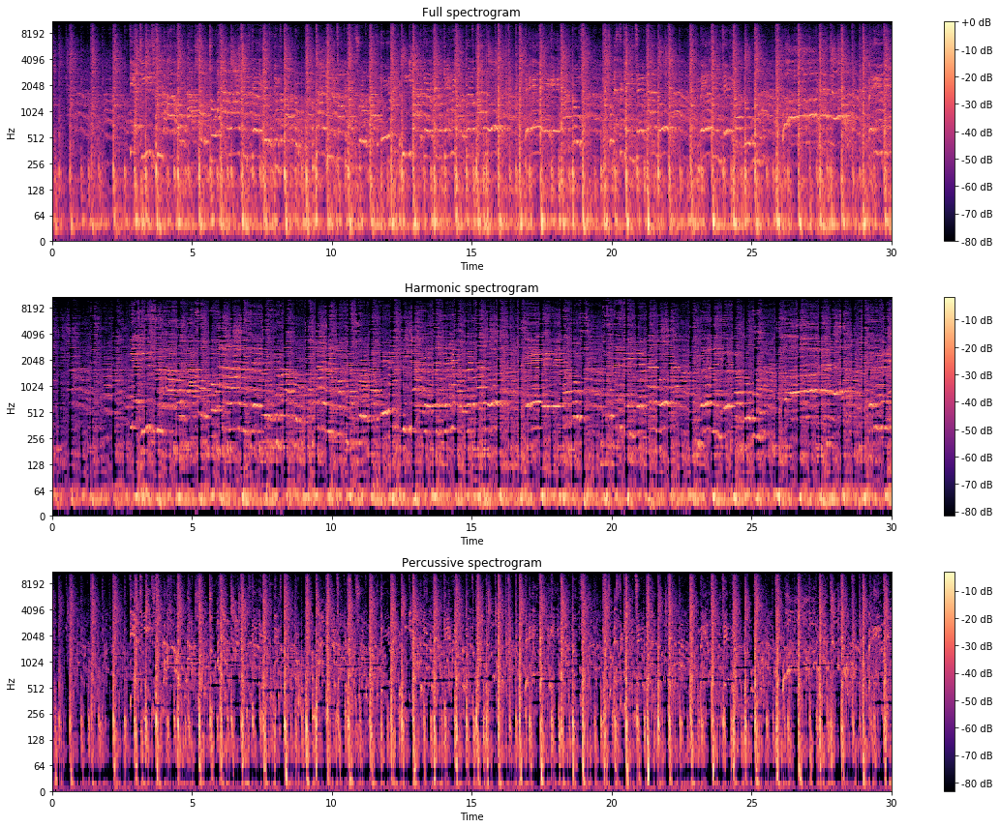

In [136]:
ref = np.max(np.abs(D))

plt.figure(figsize=(16, 12))

ax = [1, 2, 3]

specs = [D, S_harmonic, S_percussive]

titles = ['Full spectrogram', 'Harmonic spectrogram', 'Percussive spectrogram']

for axi, spec, title in zip(ax, specs, titles):
    plt.subplot(3, 1, axi)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(spec), ref=ref), y_axis='log', x_axis = 'time')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()

## Play Audios

In [137]:
y_harmonic = librosa.istft(S_harmonic)
y_percussive = librosa.istft(S_percussive)

In [138]:
ipd.Audio(y_harmonic, rate = sr)

In [139]:
ipd.Audio(y_percussive, rate = sr)

## STFT - Low

In [140]:
L = librosa.stft(y_percussive, n_fft = 1024, hop_length = 256)

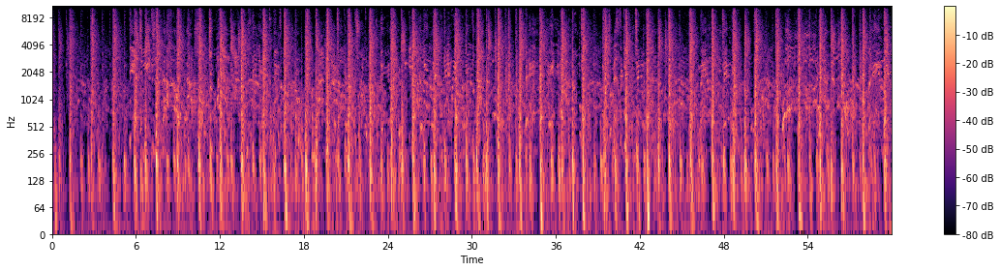

In [141]:
plt.figure(figsize=(16, 4))
librosa.display.specshow(librosa.amplitude_to_db(L, ref=np.max),y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

## Median Filter

In [142]:
L_harmonic, L_percussive = librosa.decompose.hpss(L, kernel_size = (17, 17))

## Create a Mask and Filter

In [143]:
power = 2

mask_voice = librosa.util.softmask(np.abs(L_harmonic), np.abs(L_percussive), power = power)
mask_percussive_L = librosa.util.softmask(np.abs(L_percussive), np.abs(L_harmonic), power = power)

S_voice = mask_voice*L
S2_percussive = mask_percussive_L*L

## Spectogram

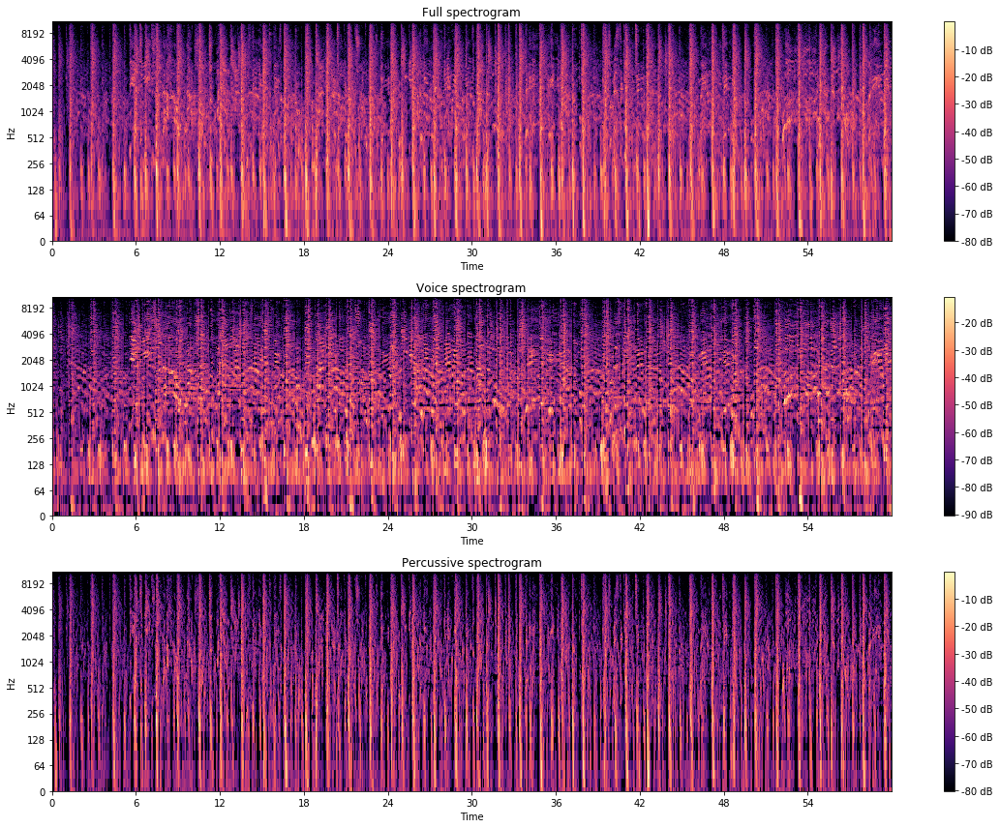

In [144]:
ref = np.max(np.abs(L))

plt.figure(figsize=(16, 12))

ax = [1, 2, 3]

specs = [L, S_voice, S2_percussive]

titles = ['Full spectrogram', 'Voice spectrogram', 'Percussive spectrogram']

for axi, spec, title in zip(ax, specs, titles):
    plt.subplot(3, 1, axi)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(spec), ref=ref), y_axis='log', x_axis = 'time')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()

## Play Audios

In [145]:
y_voice = librosa.istft(S_voice)
y2_percussive = librosa.istft(S2_percussive)

In [146]:
ipd.Audio(y_voice, rate=sr)

In [147]:
ipd.Audio(y2_percussive, rate=sr)

## Pitch modification

In [185]:
pitches, magnitudes = librosa.core.piptrack(y=y_voice, sr=sr, fmin=75, fmax=1600)

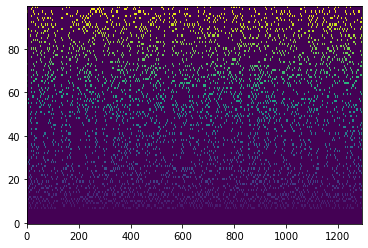

In [186]:
plt.imshow(pitches[:100, :], aspect="auto", interpolation="nearest", origin="bottom")

In [187]:
shifted = librosa.effects.pitch_shift(y=y_voice, sr=sr, n_steps=-3)

In [188]:
ipd.Audio(shifted, rate=sr)

In [189]:
pitches_shifted, magnitudes_shifted = librosa.core.piptrack(y=shifted, sr=sr, fmin=75, fmax=1600)

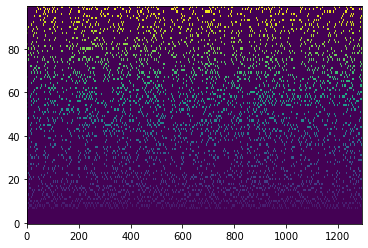

In [190]:
plt.imshow(pitches_shifted[:100, :], aspect="auto", interpolation="nearest", origin="bottom")